# **Menghubungkan ke Drive**

In [1]:
import os
from google.colab import drive

In [3]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [4]:
%cd gdrive/MyDrive/Datasets/wood_data(75-25)

/content/gdrive/.shortcut-targets-by-id/1RgLh3JBtxwQaoIgVy__ESFqFR1R2Aot1/Datasets/wood_data(75-25)


# **Preprocessing Data**

In [5]:
from keras.preprocessing.image import ImageDataGenerator

TRAINING_DIR = './train_data'
training_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    fill_mode='reflect',
    zoom_range=0.2,
)

train_generator = training_datagen.flow_from_directory(
    TRAINING_DIR,
    target_size=(255, 255),
    class_mode='categorical',
    color_mode='rgb'
)

VALIDATION_DIR = './val_data'
validation_datagen = ImageDataGenerator(rescale=1.0/255)

validation_generator = validation_datagen.flow_from_directory(
    VALIDATION_DIR,
    target_size=(255, 255),
    class_mode='categorical',
    color_mode='rgb'
)

Found 951 images belonging to 3 classes.
Found 318 images belonging to 3 classes.


In [6]:
TESTING_DIR = './test_data'
testing_datagen = ImageDataGenerator(rescale=1./255)

testing_generator = testing_datagen.flow_from_directory(
    TESTING_DIR,
    target_size=(255, 255),
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 315 images belonging to 3 classes.


# **Membangun Model CNN**

In [7]:
import tensorflow as tf

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(255, 255, 3)),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPool2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 253, 253, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 126, 126, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 124, 124, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 128)       0

In [8]:
from keras.optimizers import Adam

opt = Adam(learning_rate=0.0001)
model.compile(optimizer = opt, loss='categorical_crossentropy', metrics=['accuracy'])

# **Pelatihan Model**

In [9]:
from keras.callbacks import EarlyStopping

class callback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs = None):
    if(logs.get('loss') < 0.1 and logs.get('val_loss') < 0.2 ):
      print("\nModel has reaches expectations")
      self.model.stop_training = True

In [10]:
history = model.fit(train_generator, epochs = 100,
                    validation_data = validation_generator,
                    callbacks =[callback()], verbose = 1)

Epoch 1/100
30/30 [==============================] - 867s 29s/step - loss: 0.9840 - accuracy: 0.4826 - val_loss: 0.7086 - val_accuracy: 0.7390
Epoch 2/100
30/30 [==============================] - 42s 1s/step - loss: 0.4884 - accuracy: 0.8307 - val_loss: 0.4869 - val_accuracy: 0.7704
Epoch 3/100
30/30 [==============================] - 38s 1s/step - loss: 0.3353 - accuracy: 0.8780 - val_loss: 0.4063 - val_accuracy: 0.8616
Epoch 4/100
30/30 [==============================] - 37s 1s/step - loss: 0.3133 - accuracy: 0.8896 - val_loss: 0.3173 - val_accuracy: 0.9088
Epoch 5/100
30/30 [==============================] - 40s 1s/step - loss: 0.2919 - accuracy: 0.8980 - val_loss: 0.2835 - val_accuracy: 0.9057
Epoch 6/100
30/30 [==============================] - 37s 1s/step - loss: 0.2652 - accuracy: 0.9064 - val_loss: 0.2720 - val_accuracy: 0.8868
Epoch 7/100
30/30 [==============================] - 36s 1s/step - loss: 0.2633 - accuracy: 0.9075 - val_loss: 0.3436 - val_accuracy: 0.8805
Epoch 8/100

# **Pengujian dan Evaluasi**

Text(0.5, 1.0, 'Train - Accuracy')

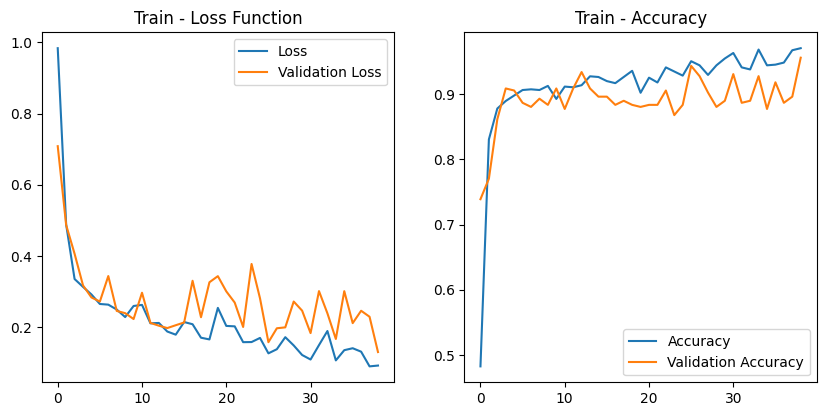

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Train - Loss Function')

plt.subplot(2, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Train - Accuracy')

10/10 [==============================] - 250s 28s/step


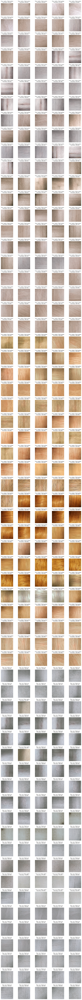

In [12]:
from PIL import Image
import numpy as np

image_paths = testing_generator.filepaths
class_names = list(testing_generator.class_indices.keys())
true_classes = testing_generator.classes
predict_result = model.predict(testing_generator)

# Inisialisasi jumlah hasil prediksi
class1_pred1 = 0
class1_pred2 = 0
class1_pred3 = 0
class2_pred1 = 0
class2_pred2 = 0
class2_pred3 = 0
class3_pred1 = 0
class3_pred2 = 0
class3_pred3 = 0

# Mengatur grid subplot
columns = 5
rows = len(predict_result) // columns + 1
figsize = (12 , 150)
fig, axs = plt.subplots(rows, columns, figsize=figsize)
axs = axs.flatten()

# Iterasi prediksi
for i, result in enumerate(predict_result):
    index = np.argmax(result)

    # Memuat dan mengatur ukuran gambar yang akan ditampilkan
    image_path = image_paths[i]
    image = Image.open(image_path)
    r_image = image.resize((150, 150))

    # Memasukkan gambar dan label ke dalam subplot
    ax = axs[i]
    ax.imshow(np.array(r_image))
    ax.set_title('True: {} / Pred: {}\nAccuracy: {:.2%}'
    .format(class_names[true_classes[i]], class_names[index], result[index]), fontsize=8)
    ax.axis('off')

    # Update penghitungan hasil prediksi berdasarkan kelas aktual (true) dan hasil prediksi
    if true_classes[i] == 0 and index == 0:
        class1_pred1 += 1
    elif true_classes[i] == 0 and index == 1:
        class1_pred2 += 1
    elif true_classes[i] == 0 and index == 2:
        class1_pred3 += 1
    elif true_classes[i] == 1 and index == 0:
        class2_pred1 += 1
    elif true_classes[i] == 1 and index == 1:
        class2_pred2 += 1
    elif true_classes[i] == 1 and index == 2:
        class2_pred3 += 1
    elif true_classes[i] == 2 and index == 0:
        class3_pred1 += 1
    elif true_classes[i] == 2 and index == 1:
        class3_pred2 += 1
    elif true_classes[i] == 2 and index == 2:
        class3_pred3 += 1

if len(predict_result) < len(axs):
    for j in range(len(predict_result), len(axs)):
        fig.delaxes(axs[j])

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

In [13]:
print('true = nantu / predicted = nantu :', class1_pred1)
print('true = nantu / predicted = palapi :', class1_pred2)
print('true = nantu / predicted = uru :', class1_pred3)
print('true = palapi / predicted = nantu :', class2_pred1)
print('true = palapi / predicted = palapi :', class2_pred2)
print('true = palapi / predicted = uru :', class2_pred3)
print('true = uru / predicted = nantu :', class3_pred1)
print('true = uru / predicted = palapi :', class3_pred2)
print('true = uru / predicted = uru :', class3_pred3)

true = nantu / predicted = nantu : 99
true = nantu / predicted = palapi : 6
true = nantu / predicted = uru : 0
true = palapi / predicted = nantu : 0
true = palapi / predicted = palapi : 105
true = palapi / predicted = uru : 0
true = uru / predicted = nantu : 8
true = uru / predicted = palapi : 0
true = uru / predicted = uru : 97


In [14]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Prediksi hasil dari model
predict_result = model.predict(testing_generator)

# Mendapatkan indeks kelas prediksi tertinggi untuk setiap prediksi
predicted_classes = np.argmax(predict_result, axis=1)

# Mendapatkan kelas yang sebenarnya dari data testing
class_names = list(testing_generator.class_indices.keys())
true_classes = testing_generator.classes

# Menampilkan classification report
print("\n Classification Report :\n")
print(classification_report(true_classes, predicted_classes, target_names=class_names))

# Menampilkan confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)
print("\n Confusion Matrix :\n")
print(cm)

# Menghitung dan menampilkan akurasi keseluruhan model
accuracy = accuracy_score(true_classes, predicted_classes)
print("\n Overall Accuracy:  {:.2f} % ".format(accuracy * 100))

10/10 [==============================] - 5s 501ms/step

 Classification Report :

              precision    recall  f1-score   support

       nantu       0.93      0.94      0.93       105
      palapi       0.95      1.00      0.97       105
         uru       1.00      0.92      0.96       105

    accuracy                           0.96       315
   macro avg       0.96      0.96      0.96       315
weighted avg       0.96      0.96      0.96       315


 Confusion Matrix :

[[ 99   6   0]
 [  0 105   0]
 [  8   0  97]]

 Overall Accuracy:  95.56 % 


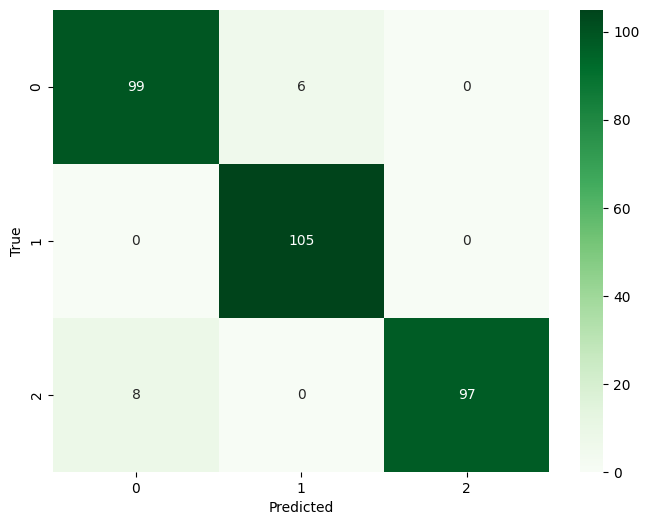

In [15]:
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **Menyimpan Model**

In [16]:
model.save('./wood_classifier_model_BS=32(95.56).h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
